In [ ]:
from google.colab import drive
drive.mount('/content/drive/')

Mounted at /content/drive/


In [ ]:
import os
import sys
os.chdir('/content/drive/MyDrive/Summer_Intern/Project_Final/MoNuSeg/Code')

ROOT_DIR = '/content/drive/MyDrive/Summer_Intern/Project_Final/MoNuSeg/Code'
sys.path.append(ROOT_DIR)


In [ ]:
!pip3 uninstall keras-nightly
!pip3 uninstall -y tensorflow
!pip3 install keras==2.1.6
!pip3 install tensorflow==1.15.0
!pip3 install h5py==2.10.0
!pip install -U scikit-image==0.16.2

Found existing installation: keras-nightly 2.5.0.dev2021032900
Uninstalling keras-nightly-2.5.0.dev2021032900:
  Would remove:
    /usr/local/lib/python3.7/dist-packages/keras/*
    /usr/local/lib/python3.7/dist-packages/keras_nightly-2.5.0.dev2021032900.dist-info/*
  Would not remove (might be manually added):
    /usr/local/lib/python3.7/dist-packages/keras/applications/resnet50.py
    /usr/local/lib/python3.7/dist-packages/keras/engine/network.py
    /usr/local/lib/python3.7/dist-packages/keras/engine/topology.py
    /usr/local/lib/python3.7/dist-packages/keras/initializers.py
    /usr/local/lib/python3.7/dist-packages/keras/layers/experimental/__init__.py
    /usr/local/lib/python3.7/dist-packages/keras/layers/experimental/preprocessing/__init__.py
    /usr/local/lib/python3.7/dist-packages/keras/objectives.py
    /usr/local/lib/python3.7/dist-packages/keras/optimizers/__init__.py
    /usr/local/lib/python3.7/dist-packages/keras/optimizers/schedules/__init__.py
    /usr/local/lib/p

In [ ]:
import h5py
import keras
import tensorflow
import skimage

Using TensorFlow backend.


In [ ]:
# Set matplotlib backend
# This has to be done before other importa that might
# set it, but only if we're running in script mode
# rather than being imported.
import os
import sys
import json
import datetime
import numpy as np
import skimage.io
import cv2
import matplotlib
import scipy.io as sio
import matplotlib.pyplot as plt
from imgaug import augmenters as iaa
from skimage.io import imread, imshow, imread_collection, concatenate_images
# Import Mask RCNN
sys.path.append(ROOT_DIR)  # To find local version of the library
from mrcnn.config import Config
from mrcnn import utils
from mrcnn import visualize
from mrcnn import model as modellib
import itertools
import math
import logging
import re
import random
from collections import OrderedDict
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import matplotlib.lines as lines
from matplotlib.patches import Polygon
from skimage.transform import resize
# Root directory of the project
ROOT_DIR = os.path.abspath("../../")

MODEL_DIR = "/content/drive/MyDrive/Summer_Intern/Project_Final/MoNuSeg/Code/logs_focal_imgnet"

# Path to Ballon trained weights
# You can download this file from the Releases page
# https://github.com/matterport/Mask_RCNN/releases
Neucleus_WEIGHTS_PATH = "/content/drive/MyDrive/Summer_Intern/Project_Final/MoNuSeg/Code/logs_focal_imgnet_patches/nucleus20210708T1239/mask_rcnn_nucleus_0075.h5" 
#nucleus20210708T1239 Focal imgnet
#nucleus20210704T1155 Binary Imgnet
#nucleus20210710T0530 Binary COCO
#nucleus20210711T1120 Focal COCO
#nucleus20210716T1310 _binary_dice COCO

# Import Mask RCNN
sys.path.append(ROOT_DIR)  # To find local version of the library
from mrcnn import utils
from mrcnn import visualize
from mrcnn.visualize import display_images
import mrcnn.model as modellib
from mrcnn.model import log

%matplotlib inline 

In [ ]:
VAL_IMAGE_IDS = [
    "0c2550a23b8a0f29a7575de8c61690d3c31bc897dd5ba66caec201d201a278c2",
    "92f31f591929a30e4309ab75185c96ff4314ce0a7ead2ed2c2171897ad1da0c7",
    "1e488c42eb1a54a3e8412b1f12cde530f950f238d71078f2ede6a85a02168e1f",
    "c901794d1a421d52e5734500c0a2a8ca84651fb93b19cec2f411855e70cae339",
    "8e507d58f4c27cd2a82bee79fe27b069befd62a46fdaed20970a95a2ba819c7b",
    "60cb718759bff13f81c4055a7679e81326f78b6a193a2d856546097c949b20ff",
    "da5f98f2b8a64eee735a398de48ed42cd31bf17a6063db46a9e0783ac13cd844",
    "9ebcfaf2322932d464f15b5662cae4d669b2d785b8299556d73fffcae8365d32",
    "1b44d22643830cd4f23c9deadb0bd499fb392fb2cd9526d81547d93077d983df",
    "97126a9791f0c1176e4563ad679a301dac27c59011f579e808bbd6e9f4cd1034",
    "e81c758e1ca177b0942ecad62cf8d321ffc315376135bcbed3df932a6e5b40c0",
    "f29fd9c52e04403cd2c7d43b6fe2479292e53b2f61969d25256d2d2aca7c6a81",
    "0ea221716cf13710214dcd331a61cea48308c3940df1d28cfc7fd817c83714e1",
    "3ab9cab6212fabd723a2c5a1949c2ded19980398b56e6080978e796f45cbbc90",
    "ebc18868864ad075548cc1784f4f9a237bb98335f9645ee727dac8332a3e3716",
    "bb61fc17daf8bdd4e16fdcf50137a8d7762bec486ede9249d92e511fcb693676",
    "e1bcb583985325d0ef5f3ef52957d0371c96d4af767b13e48102bca9d5351a9b",
    "947c0d94c8213ac7aaa41c4efc95d854246550298259cf1bb489654d0e969050",
    "cbca32daaae36a872a11da4eaff65d1068ff3f154eedc9d3fc0c214a4e5d32bd",
    "f4c4db3df4ff0de90f44b027fc2e28c16bf7e5c75ea75b0a9762bbb7ac86e7a3",
    "4193474b2f1c72f735b13633b219d9cabdd43c21d9c2bb4dfc4809f104ba4c06",
    "f73e37957c74f554be132986f38b6f1d75339f636dfe2b681a0cf3f88d2733af",
    "a4c44fc5f5bf213e2be6091ccaed49d8bf039d78f6fbd9c4d7b7428cfcb2eda4",
    "cab4875269f44a701c5e58190a1d2f6fcb577ea79d842522dcab20ccb39b7ad2",
    "8ecdb93582b2d5270457b36651b62776256ade3aaa2d7432ae65c14f07432d49",
    "TCGA-HE-7129-01Z-00-DX1_0",
    "TCGA-HE-7129-01Z-00-DX1_1",
    "TCGA-HE-7129-01Z-00-DX1_2",
    "TCGA-RD-A8N9-01A-01-TS1_0",
    "TCGA-RD-A8N9-01A-01-TS1_1",
    "TCGA-AR-A1AS-01Z-00-DX1_0",
    "TCGA-AR-A1AS-01Z-00-DX1_1",
    "TCGA-AR-A1AS-01Z-00-DX1_2",
]

seed = np.random.RandomState(10)

class NucleusDataset(utils.Dataset):

    def load_nucleus(self, dataset_dir, subset):
        """Load a subset of the nuclei dataset.

        dataset_dir: Root directory of the dataset
        subset: Subset to load. Either the name of the sub-directory,
                such as stage1_train, stage1_test, ...etc. or, one of:
                * train: stage1_train excluding validation images
                * val: validation images from VAL_IMAGE_IDS
        """
        # Add classes. We have one class.
        # Naming the dataset nucleus, and the class nucleus
        self.add_class("nucleus", 1, "nucleus")

        # Which subset?
        # "val": use hard-coded list above
        # "train": use data from stage1_train minus the hard-coded list above
        # else: use the data from the specified sub-directory
        assert subset in ["train", "val", "test_extra_data",
                          "stage1_train", "stage1_test"]
        subset_dir = "stage1_train" if subset in ["train", "val"] else subset
        dataset_dir = os.path.join(dataset_dir, subset_dir)
        if subset == "val":
            image_ids = VAL_IMAGE_IDS
        else:
            image_ids = next(os.walk(dataset_dir))[1]
            if subset == "train" : #or subset == "val":
                image_ids = list(set(image_ids) - set(VAL_IMAGE_IDS))

            #train_list, val_list = train_test_split(image_ids, test_size=0.1,
            #                                random_state=10)
            #image_ids = train_list
            #if subset == "val":
            #    image_ids = val_list

        # Add images
        for image_id in image_ids:
            self.add_image(
                "nucleus",
                image_id=image_id,
                path=os.path.join(dataset_dir, image_id, "images/{}.png".format(image_id)))

    def load_mask(self, image_id):
        """Generate instance masks for an image.
       Returns:
        masks: A bool array of shape [height, width, instance count] with
            one mask per instance.
        class_ids: a 1D array of class IDs of the instance masks.
        """
        info = self.image_info[image_id]
        # Get mask directory from image path
        mask_dir = os.path.join(os.path.dirname(
            os.path.dirname(info['path'])), "masks")

        # Read mask files from .png image
        mask = []
        for f in next(os.walk(mask_dir))[2]:
            mask_path = os.path.join(mask_dir,f)
                
            flag = 0
            if f.endswith(".mat"):
                mask = sio.loadmat(mask_path)['data'].astype(np.bool)
                flag =1
                break
            if f.endswith(".png"):
                m = skimage.io.imread(os.path.join(
                    mask_dir, f)).astype(np.bool)
                mask.append(m)
        if (flag == 0):
          mask = np.stack(mask, axis=-1)
        
        # Return mask, and array of class IDs of each instance. Since we have
        # one class ID, we return an array of ones
        return mask, np.ones([mask.shape[-1]], dtype=np.int32)

    def image_reference(self, image_id):
        """Return the path of the image."""
        info = self.image_info[image_id]
        if info["source"] == "nucleus":
            return info["id"]
        else:
            super(self.__class__, self).image_reference(image_id)


In [ ]:
# Load dataset
dataset = NucleusDataset()

DATASET_DIR = '/content/drive/MyDrive/Summer_Intern/Project_Final/MoNuSeg/Data'
dataset.load_nucleus(DATASET_DIR, subset="test_extra_data")

# Must call before using the dataset
dataset.prepare()

print("Image Count: {}".format(len(dataset.image_ids)))
print("Class Count: {}".format(dataset.num_classes))
for i, info in enumerate(dataset.class_info):
    print("{:3}. {:50}".format(i, info['name']))

Image Count: 56
Class Count: 2
  0. BG                                                
  1. nucleus                                           


In [ ]:
class NucleusConfig(Config):
    # Give the configuration a recognizable name
    NAME = "nucleus"

    # Adjust depending on your GPU memory
    IMAGES_PER_GPU = 2

    # Number of classes (including background)
    NUM_CLASSES = 1 + 1  # Background + nucleus

    # Number of training and validation steps per epoch
    STEPS_PER_EPOCH = 100  # (657 - len(VAL_IMAGE_IDS)) // IMAGES_PER_GPU
    VALIDATION_STEPS = 50

    # Don't exclude based on confidence. Since we have two classes
    # then 0.5 is the minimum anyway as it picks between nucleus and BG
    DETECTION_MIN_CONFIDENCE = 0.75
    DETECTION_MASK_THRESHOLD  = 0.35
    # Backbone network architecture
    # Supported values are: resnet50, resnet101
    BACKBONE = "resnet50"
    #BACKBONE_SHAPES =  [[128,128],
    #                    [ 64,64],
    #                    [ 32,32],
    #                    [ 16 ,16],
    #                    [  8 , 8]]
    # Input image resizing
    # Random crops of size 512x512
    IMAGE_RESIZE_MODE = "crop"
    IMAGE_MIN_DIM = 512
    IMAGE_MAX_DIM = 512
    IMAGE_MIN_SCALE = 2.0

    # Length of square anchor side in pixels
    RPN_ANCHOR_SCALES = (8, 16, 32, 64, 128)

    # ROIs kept after non-maximum supression (training and inference)
    POST_NMS_ROIS_TRAINING = 1000
    POST_NMS_ROIS_INFERENCE = 2000

    # Non-max suppression threshold to filter RPN proposals.
    # You can increase this during training to generate more propsals.
    RPN_NMS_THRESHOLD = 0.9

    # How many anchors per image to use for RPN training
    RPN_TRAIN_ANCHORS_PER_IMAGE = 320

    # Image mean (RGB)
    MEAN_PIXEL = np.array([123.7,116.8,103.9])

    # If enabled, resizes instance masks to a smaller size to reduce
    # memory load. Recommended when using high-resolution images.
    USE_MINI_MASK = True
    MINI_MASK_SHAPE = (56, 56)  # (height, width) of the mini-mask

    # Number of ROIs per image to feed to classifier/mask heads
    # The Mask RCNN paper uses 512 but often the RPN doesn't generate
    # enough positive proposals to fill this and keep a positive:negative
    # ratio of 1:3. You can increase the number of proposals by adjusting
    # the RPN NMS threshold.
    TRAIN_ROIS_PER_IMAGE = 512

    # Maximum number of ground truth instances to use in one image
    MAX_GT_INSTANCES = 500
    OPTIMIZER = 'ADAM'
    # Max number of final detections per image
    DETECTION_MAX_INSTANCES = 400


class NucleusInferenceConfig(NucleusConfig):
    # Set batch size to 1 to run one image at a time
    GPU_COUNT = 1
    IMAGES_PER_GPU = 1
    # Don't resize imager for inferencing
    IMAGE_RESIZE_MODE = "pad64"
    # Non-max suppression threshold to filter RPN proposals.
    # You can increase this during training to generate more propsals.
    RPN_NMS_THRESHOLD = 0.7

In [ ]:
config =  NucleusInferenceConfig()
config.display()


Configurations:
BACKBONE                       resnet50
BACKBONE_STRIDES               [4, 8, 16, 32, 64]
BATCH_SIZE                     1
BBOX_STD_DEV                   [0.1 0.1 0.2 0.2]
COMPUTE_BACKBONE_SHAPE         None
DETECTION_MASK_THRESHOLD       0.35
DETECTION_MAX_INSTANCES        400
DETECTION_MIN_CONFIDENCE       0.75
DETECTION_NMS_THRESHOLD        0.3
FPN_CLASSIF_FC_LAYERS_SIZE     1024
GPU_COUNT                      1
GRADIENT_CLIP_NORM             5.0
IMAGES_PER_GPU                 1
IMAGE_CHANNEL_COUNT            3
IMAGE_MAX_DIM                  512
IMAGE_META_SIZE                14
IMAGE_MIN_DIM                  512
IMAGE_MIN_SCALE                2.0
IMAGE_RESIZE_MODE              pad64
IMAGE_SHAPE                    [512 512   3]
LEARNING_MOMENTUM              0.9
LEARNING_RATE                  0.001
LOSS_WEIGHTS                   {'rpn_class_loss': 1.0, 'rpn_bbox_loss': 1.0, 'mrcnn_class_loss': 1.0, 'mrcnn_bbox_loss': 1.0, 'mrcnn_mask_loss': 1.0}
MASK_POOL_SIZE      

In [ ]:
model = modellib.MaskRCNN(mode="inference", model_dir=MODEL_DIR,
                              config=config)

In [ ]:
weights_path = Neucleus_WEIGHTS_PATH

# Load weights
print("Loading weights ", weights_path)
model.load_weights(weights_path, by_name=True)

Loading weights  /content/drive/MyDrive/Summer_Intern/Project_Final/MoNuSeg/Code/logs_focal_imgnet_patches/nucleus20210708T1239/mask_rcnn_nucleus_0075.h5
Re-starting from epoch 75


In [ ]:
image = dataset.load_image(0)
class_names = ['BG', 'nucleus ']

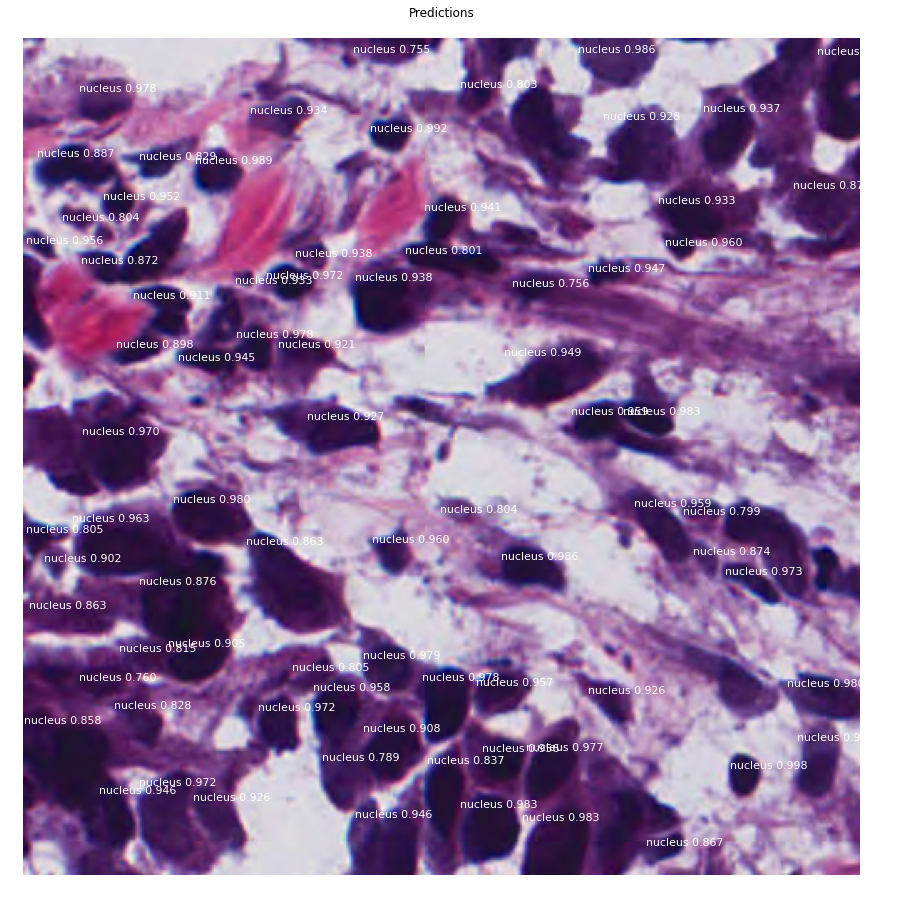

In [ ]:
results = model.detect([image], verbose=0)
# get dictionary for first prediction
r = results[0]
# show photo with bounding boxes, masks, class labels and scores
visualize.display_instances(
            image, r['rois'], r['masks'], r['class_ids'],
            dataset.class_names, r['scores'],
            show_bbox=False, show_mask=True,
            title="Predictions")
#visualize.display_instances(image, r['rois'], r['masks'], r['class_ids'], class_names, r['scores'])


*** No instances to display *** 



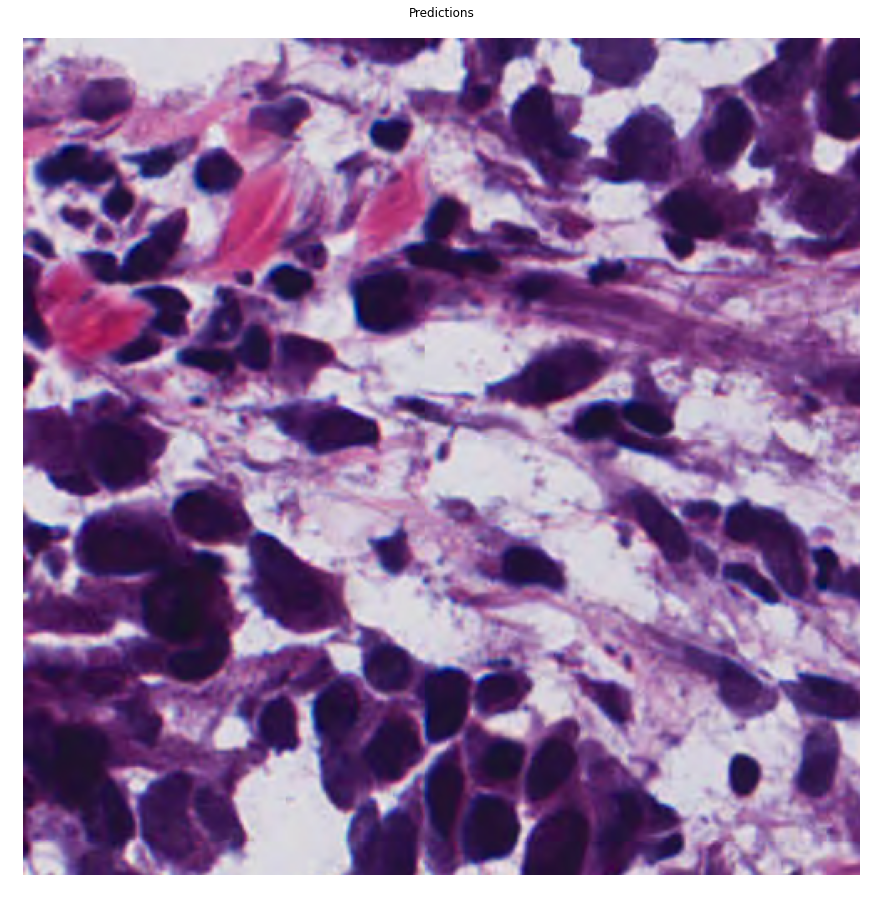

In [ ]:
from scipy.ndimage.morphology import binary_fill_holes
from skimage.morphology import dilation, erosion
from skimage.measure import find_contours
from skimage.measure import label

def postprocess_masks(result, image, min_nuc_size=10):

    """Clean overlaps between bounding boxes, fill small holes, smooth boundaries"""

    height, width = image.shape[:2]

    # If there is no mask prediction do the following
    if result['masks'].shape[0] == 0:
        result['masks'] = np.zeros([height, width, 1])
        result['masks'][0, 0, 0] = 1
        result['scores'] = np.ones(1)
        result['class_ids'] = np.ones(1)

    keep_ind = np.where(np.sum(result['masks'], axis=(0, 1)) > min_nuc_size)[0]
    if len(keep_ind) < result['masks'].shape[-1]:
        # print('Deleting',len(result['masks'])-len(keep_ind), ' empty result['masks']')
        result['masks'] = result['masks'][..., keep_ind]
        result['scores'] = result['scores'][keep_ind]
        result['rois'] = result['rois'][keep_ind]
        result['class_ids'] = result['class_ids'][keep_ind]

    sort_ind = np.argsort(result['scores'])[::-1]
    result['masks'] = result['masks'][..., sort_ind]
    overlap = np.zeros([height, width])

    # Removes overlaps from masks with lower score
    for mm in range(result['masks'].shape[-1]):
        # Fill holes inside the mask
        mask = binary_fill_holes(result['masks'][..., mm]).astype(np.uint8)
        # Smoothen edges using dilation and erosion
        mask = erosion(dilation(mask))
        # Delete overlaps
        overlap += mask
        mask[overlap > 1] = 0
        out_label = label(mask)
        # Remove all the pieces if there are more than one pieces
        if out_label.max() > 1:
            mask[()] = 0

        result['masks'][..., mm] = mask

    keep_ind = np.where(np.sum(result['masks'], axis=(0, 1)) > min_nuc_size)[0]
    if len(keep_ind) < result['masks'].shape[-1]:
        result['masks'] = result['masks'][..., keep_ind]
        result['scores'] = result['scores'][keep_ind]
        result['rois'] = result['rois'][keep_ind]
        result['class_ids'] = result['class_ids'][keep_ind]

    return result

result =  postprocess_masks(r, image, min_nuc_size=10)
r = result
# show photo with bounding boxes, masks, class labels and scores
visualize.display_instances(
            image, r['rois'], r['masks'], r['class_ids'],
            dataset.class_names, r['scores'],
            show_bbox=False, show_mask=False,
            title="Predictions")


In [ ]:
def get_ax(rows=1, cols=1, size=16):
    """Return a Matplotlib Axes array to be used in
    all visualizations in the notebook. Provide a
    central point to control graph sizes.
    
    Adjust the size attribute to control how big to render images
    """
    _, ax = plt.subplots(rows, cols, figsize=(size*cols, size*rows))
    return ax

image ID: nucleus.TCGA-A6-6782-01A-01-BS1_1 (5) TCGA-A6-6782-01A-01-BS1_1
Original image shape:  [500 500   3]
gt_class_id              shape: (89,)                 min:    1.00000  max:    1.00000  int32
gt_bbox                  shape: (89, 4)               min:   12.00000  max: 1012.00000  int32
gt_mask                  shape: (1024, 1024, 89)      min:    0.00000  max:    1.00000  bool
AP @0.50:	 0.369
AP @0.55:	 0.307
AP @0.60:	 0.260
AP @0.65:	 0.188
AP @0.70:	 0.053
AP @0.75:	 0.015
AP @0.80:	 0.010
AP @0.85:	 0.000
AP @0.90:	 0.000
AP @0.95:	 0.000
AP @0.50-0.95:	 0.120


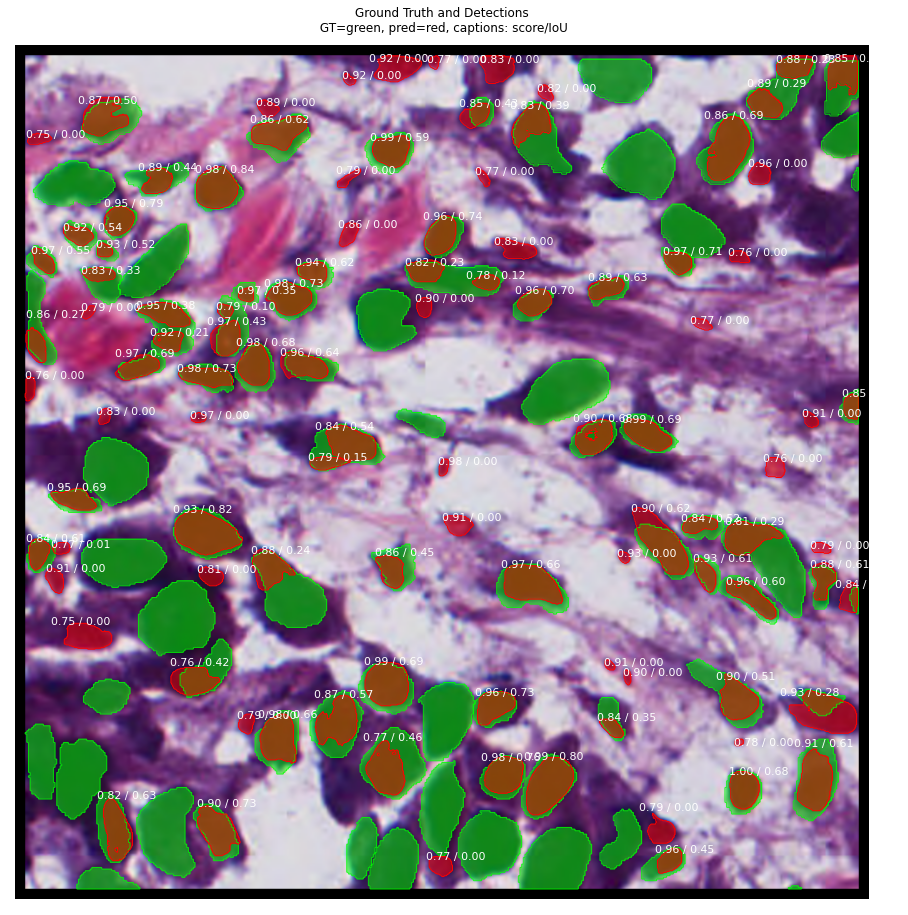

In [ ]:
image_id = 5#random.choice(dataset.image_ids)
image, image_meta, gt_class_id, gt_bbox, gt_mask =\
    modellib.load_image_gt(dataset, config, 0, use_mini_mask=False)
info = dataset.image_info[image_id]
print("image ID: {}.{} ({}) {}".format(info["source"], info["id"], image_id, 
                                       dataset.image_reference(image_id)))
print("Original image shape: ", modellib.parse_image_meta(image_meta[np.newaxis,...])["original_image_shape"][0])

#print(gt_class_id)
# Run object detection
#results = model.detect_molded(np.expand_dims(image, 0), np.expand_dims(image_meta, 0), verbose=1)
results =  model.detect([image], verbose=0)
# Display results
r = results[0]
log("gt_class_id", gt_class_id)
log("gt_bbox", gt_bbox)
log("gt_mask", gt_mask)

# Compute AP over range 0.5 to 0.95 and print it
utils.compute_ap_range(gt_bbox, gt_class_id, gt_mask,
                       r['rois'], r['class_ids'], r['scores'], r['masks'],
                       verbose=1)

visualize.display_differences(
    image,
    gt_bbox, gt_class_id, gt_mask,
    r['rois'], r['class_ids'], r['scores'], r['masks'],
    dataset.class_names, ax=get_ax(),
    show_box=False, show_mask=True,
    iou_threshold=0.5, score_threshold=0.5)

#print(mean_iou(gt_mask,r['masks']))

In [ ]:
mAP, precisions, recalls, overlaps = utils.compute_ap(gt_bbox, gt_class_id, gt_mask, r['rois'], r['class_ids'], r['scores'], r['masks'],
               iou_threshold=0.5)


In [ ]:
mAP

0.0

In [ ]:
print(np.mean(precisions),np.mean(recalls))

0.0 0.009259259259259259


In [ ]:
recall, positive_ids = utils.compute_recall(r['rois'], gt_bbox, iou = 0.5)
print(len(positive_ids))
print(recall)

59
0.6629213483146067


In [ ]:
def compute_batch_ap(dataset, image_ids, verbose=1):
    APs = []
    for image_id in image_ids:
        # Load image
        image, image_meta, gt_class_id, gt_bbox, gt_mask =\
            modellib.load_image_gt(dataset, config,
                                   image_id, use_mini_mask=False)
        # Run object detection
        results = model.detect_molded(image[np.newaxis], image_meta[np.newaxis], verbose=0)
        # Compute AP over range 0.5 to 0.95
        r = results[0]
        ap = utils.compute_ap_range(
            gt_bbox, gt_class_id, gt_mask,
            r['rois'], r['class_ids'], r['scores'], r['masks'],
            verbose=0)
        APs.append(ap)
        if verbose:
            info = dataset.image_info[image_id]
            meta = modellib.parse_image_meta(image_meta[np.newaxis,...])
            print("{:3} {}   AP: {:.2f}".format(
                meta["image_id"][0], meta["original_image_shape"][0], ap))
    return APs

# Run on validation set
limit = 5
APs = compute_batch_ap(dataset, dataset.image_ids[:limit])
print("Mean AP overa {} images: {:.4f}".format(len(APs), np.mean(APs)))

  0 [500 500   3]   AP: 0.00
  1 [500 500   3]   AP: 0.00
  2 [500 500   3]   AP: 0.00
  3 [500 500   3]   AP: 0.00
  4 [500 500   3]   AP: 0.00
Mean AP overa 5 images: 0.0000


In [ ]:
def compute_overlaps_masks(masks1, masks2):
    """Computes IoU overlaps between two sets of masks.
    masks1, masks2: [Height, Width, instances]
    """
    
    # If either set of masks is empty return empty result
    if masks1.shape[-1] == 0 or masks2.shape[-1] == 0:
        return np.zeros((masks1.shape[-1], masks2.shape[-1]))
    # flatten masks and compute their areas
    masks1 = np.reshape(masks1 > .5, (-1, masks1.shape[-1])).astype(np.float32)
    masks2 = np.reshape(masks2 > .5, (-1, masks2.shape[-1])).astype(np.float32)
    area1 = np.sum(masks1, axis=0)
    area2 = np.sum(masks2, axis=0)

    # intersections and union
    intersections = np.dot(masks1.T, masks2)
    union = area1[:, None] + area2[None, :] - intersections
    overlaps = intersections / union

    return overlaps
def trim_zeros(x):
    """It's common to have tensors larger than the available data and
    pad with zeros. This function removes rows that are all zeros.
    x: [rows, columns].
    """
    assert len(x.shape) == 2
    return x[~np.all(x == 0, axis=1)]
def compute_matches(gt_boxes, gt_class_ids, gt_masks,
                    pred_boxes, pred_class_ids, pred_scores, pred_masks,
                    iou_threshold=0.5, score_threshold=0.0):
    """Finds matches between prediction and ground truth instances.
    Returns:
        gt_match: 1-D array. For each GT box it has the index of the matched
                  predicted box.
        pred_match: 1-D array. For each predicted box, it has the index of
                    the matched ground truth box.
        overlaps: [pred_boxes, gt_boxes] IoU overlaps.
    """
    # Trim zero padding
    # TODO: cleaner to do zero unpadding upstream
    gt_boxes = trim_zeros(gt_boxes)
    gt_masks = gt_masks[..., :gt_boxes.shape[0]]
    pred_boxes = trim_zeros(pred_boxes)
    pred_scores = pred_scores[:pred_boxes.shape[0]]
    # Sort predictions by score from high to low
    indices = np.argsort(pred_scores)[::-1]
    pred_boxes = pred_boxes[indices]
    pred_class_ids = pred_class_ids[indices]
    pred_scores = pred_scores[indices]
    pred_masks = pred_masks[..., indices]

    # Compute IoU overlaps [pred_masks, gt_masks]
    overlaps = compute_overlaps_masks(pred_masks, gt_masks)

    # Loop through predictions and find matching ground truth boxes
    match_count = 0
    pred_match = -1 * np.ones([pred_boxes.shape[0]])
    gt_match = -1 * np.ones([gt_boxes.shape[0]])
    for i in range(len(pred_boxes)):
        # Find best matching ground truth box
        # 1. Sort matches by score
        sorted_ixs = np.argsort(overlaps[i])[::-1]
        # 2. Remove low scores
        low_score_idx = np.where(overlaps[i, sorted_ixs] < score_threshold)[0]
        if low_score_idx.size > 0:
            sorted_ixs = sorted_ixs[:low_score_idx[0]]
        # 3. Find the match
        for j in sorted_ixs:
            # If ground truth box is already matched, go to next one
            if gt_match[j] > -1:
                continue
            # If we reach IoU smaller than the threshold, end the loop
            iou = overlaps[i, j]
            if iou < iou_threshold:
                break
            # Do we have a match?
            if pred_class_ids[i] == gt_class_ids[j]:
                match_count += 1
                gt_match[j] = i
                pred_match[i] = j
                break

    return gt_match, pred_match, overlaps


In [ ]:
gt_match, pred_match, overlaps = compute_matches(
        gt_bbox, gt_class_id, gt_mask,
        r['rois'], r['class_ids'], r['scores'], r['masks'],
        iou_threshold=0.5)

In [ ]:
#####
def get_fast_aji(true, pred):
    """
    AJI version distributed by MoNuSeg, has no permutation problem but suffered from 
    over-penalisation similar to DICE2
    Fast computation requires instance IDs are in contiguous orderding i.e [1, 2, 3, 4] 
    not [2, 3, 6, 10]. Please call `remap_label` before hand and `by_size` flag has no 
    effect on the result.
    """
    true = np.copy(true) # ? do we need this
    pred = np.copy(pred)
    true_id_list = list(np.unique(true))
    pred_id_list = list(np.unique(pred))

    true_masks = [None,]
    for t in true_id_list[1:]:
        t_mask = np.array(true == t, np.uint8)
        true_masks.append(t_mask)
    
    pred_masks = [None,]
    for p in pred_id_list[1:]:
        p_mask = np.array(pred == p, np.uint8)
        pred_masks.append(p_mask)
    
    # prefill with value
    pairwise_inter = np.zeros([len(true_id_list) -1, 
                               len(pred_id_list) -1], dtype=np.float64)
    pairwise_union = np.zeros([len(true_id_list) -1, 
                               len(pred_id_list) -1], dtype=np.float64)

    # caching pairwise
    for true_id in true_id_list[1:]: # 0-th is background
        t_mask = true_masks[true_id]
        pred_true_overlap = pred[t_mask > 0]
        pred_true_overlap_id = np.unique(pred_true_overlap)
        pred_true_overlap_id = list(pred_true_overlap_id)
        for pred_id in pred_true_overlap_id:
            if pred_id == 0: # ignore
                continue # overlaping background
            p_mask = pred_masks[pred_id]
            total = (t_mask + p_mask).sum()
            inter = (t_mask * p_mask).sum()
            pairwise_inter[true_id-1, pred_id-1] = inter
            pairwise_union[true_id-1, pred_id-1] = total - inter
    #
    pairwise_iou = pairwise_inter / (pairwise_union + 1.0e-6)
    # pair of pred that give highest iou for each true, dont care 
    # about reusing pred instance multiple times
    paired_pred = np.argmax(pairwise_iou, axis=1)
    pairwise_iou = np.max(pairwise_iou, axis=1)
    # exlude those dont have intersection
    paired_true = np.nonzero(pairwise_iou > 0.0)[0]
    paired_pred = paired_pred[paired_true]
    # print(paired_true.shape, paired_pred.shape)
    overall_inter = (pairwise_inter[paired_true, paired_pred]).sum()
    overall_union = (pairwise_union[paired_true, paired_pred]).sum()
    #
    paired_true = (list(paired_true + 1)) # index to instance ID
    paired_pred = (list(paired_pred + 1))
    # add all unpaired GT and Prediction into the union
    unpaired_true = np.array([idx for idx in true_id_list[1:] if idx not in paired_true])
    unpaired_pred = np.array([idx for idx in pred_id_list[1:] if idx not in paired_pred])
    for true_id in unpaired_true:
        overall_union += true_masks[true_id].sum()
    for pred_id in unpaired_pred:
        overall_union += pred_masks[pred_id].sum()
    #
    aji_score = overall_inter / overall_union
    return aji_score
get_fast_aji(gt_match, pred_match)

In [ ]:
# Get anchors and convert to pixel coordinates
anchors = model.get_anchors(image.shape)
anchors = utils.denorm_boxes(anchors, image.shape[:2])
log("anchors", anchors)

# Generate RPN trainig targets
# target_rpn_match is 1 for positive anchors, -1 for negative anchors
# and 0 for neutral anchors.
target_rpn_match, target_rpn_bbox = modellib.build_rpn_targets(
    image.shape, anchors, gt_class_id, gt_bbox, model.config)
log("target_rpn_match", target_rpn_match)
log("target_rpn_bbox", target_rpn_bbox)

positive_anchor_ix = np.where(target_rpn_match[:] == 1)[0]
negative_anchor_ix = np.where(target_rpn_match[:] == -1)[0]
neutral_anchor_ix = np.where(target_rpn_match[:] == 0)[0]
positive_anchors = anchors[positive_anchor_ix]
negative_anchors = anchors[negative_anchor_ix]
neutral_anchors = anchors[neutral_anchor_ix]
log("positive_anchors", positive_anchors)
log("negative_anchors", negative_anchors)
log("neutral anchors", neutral_anchors)

# Apply refinement deltas to positive anchors
refined_anchors = utils.apply_box_deltas(
    positive_anchors,
    target_rpn_bbox[:positive_anchors.shape[0]] * model.config.RPN_BBOX_STD_DEV)
log("refined_anchors", refined_anchors, )

anchors                  shape: (261888, 4)           min:  -91.00000  max: 1051.00000  int32
target_rpn_match         shape: (261888,)             min:   -1.00000  max:    1.00000  int32
target_rpn_bbox          shape: (320, 4)              min:   -3.47826  max:    3.47826  float64
positive_anchors         shape: (107, 4)              min:    0.00000  max: 1024.00000  int32
negative_anchors         shape: (213, 4)              min:   -6.00000  max: 1037.00000  int32
neutral anchors          shape: (261568, 4)           min:  -91.00000  max: 1051.00000  int32
refined_anchors          shape: (107, 4)              min:   12.00000  max: 1012.00000  float32


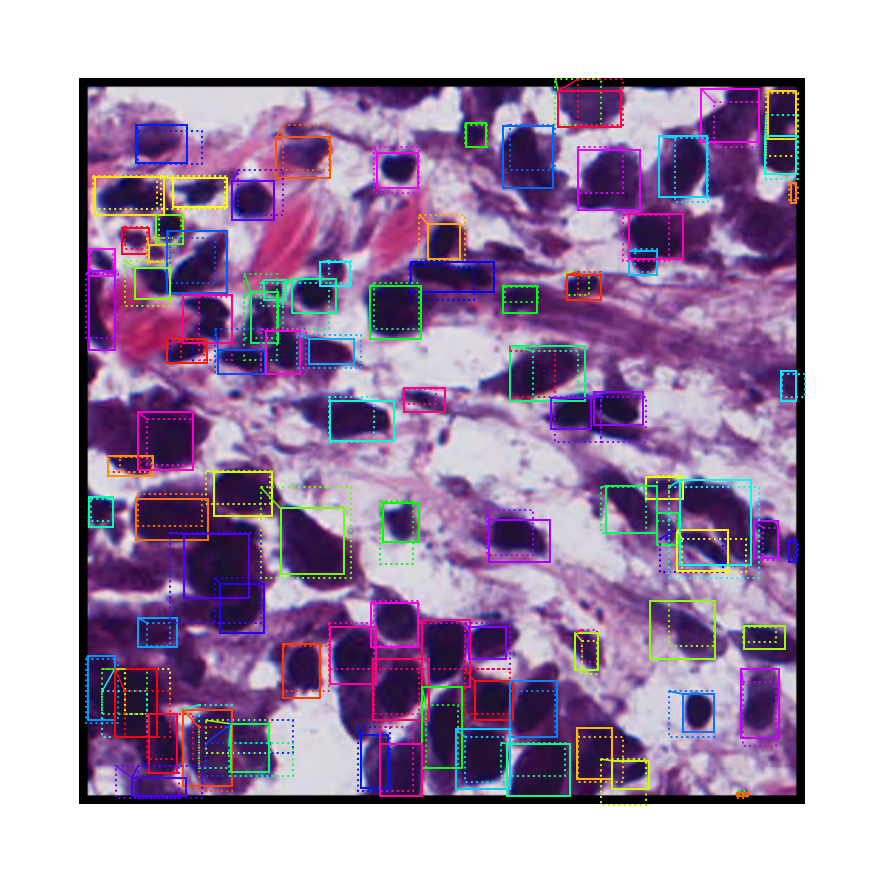

In [ ]:
# Display positive anchors before refinement (dotted) and
# after refinement (solid).
visualize.draw_boxes(
    image, ax=get_ax(),
    boxes=positive_anchors,
    refined_boxes=refined_anchors)

In [ ]:
# Run RPN sub-graph
pillar = model.keras_model.get_layer("ROI").output  # node to start searching from

# TF 1.4 and 1.9 introduce new versions of NMS. Search for all names to support TF 1.3~1.10
nms_node = model.ancestor(pillar, "ROI/rpn_non_max_suppression:0")
if nms_node is None:
    nms_node = model.ancestor(pillar, "ROI/rpn_non_max_suppression/NonMaxSuppressionV2:0")
if nms_node is None: #TF 1.9-1.10
    nms_node = model.ancestor(pillar, "ROI/rpn_non_max_suppression/NonMaxSuppressionV3:0")

rpn = model.run_graph(image[np.newaxis], [
    ("rpn_class", model.keras_model.get_layer("rpn_class").output),
    ("pre_nms_anchors", model.ancestor(pillar, "ROI/pre_nms_anchors:0")),
    ("refined_anchors", model.ancestor(pillar, "ROI/refined_anchors:0")),
    ("refined_anchors_clipped", model.ancestor(pillar, "ROI/refined_anchors_clipped:0")),
    ("post_nms_anchor_ix", nms_node),
    ("proposals", model.keras_model.get_layer("ROI").output),
], image_metas=image_meta[np.newaxis])

rpn_class                shape: (1, 261888, 2)        min:    0.00000  max:    1.00000  float32
pre_nms_anchors          shape: (1, 6000, 4)          min:   -0.08847  max:    1.00648  float32
refined_anchors          shape: (1, 6000, 4)          min:   -0.08439  max:    1.00519  float32
refined_anchors_clipped  shape: (1, 6000, 4)          min:    0.00000  max:    1.00000  float32
post_nms_anchor_ix       shape: (2000,)               min:    0.00000  max: 2130.00000  int32
proposals                shape: (1, 2000, 4)          min:    0.00000  max:    0.99994  float32


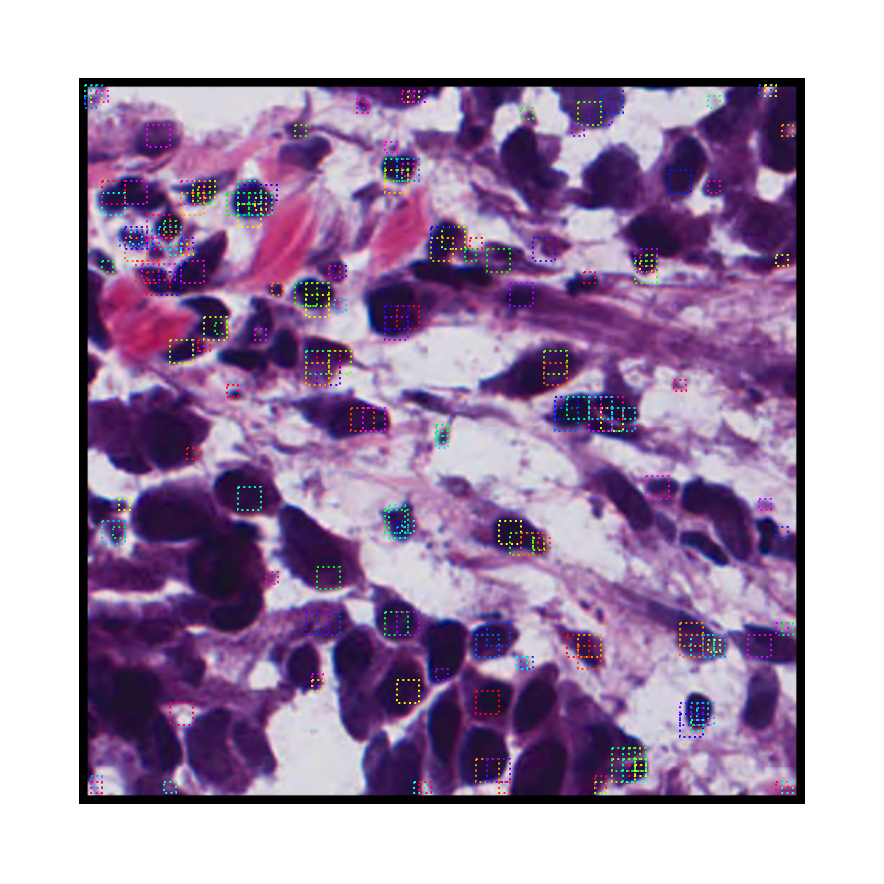

In [ ]:
# Show top anchors by score (before refinement)
limit = 200
sorted_anchor_ids = np.argsort(rpn['rpn_class'][:,:,1].flatten())[::-1]
visualize.draw_boxes(image, boxes=anchors[sorted_anchor_ids[:limit]], ax=get_ax())

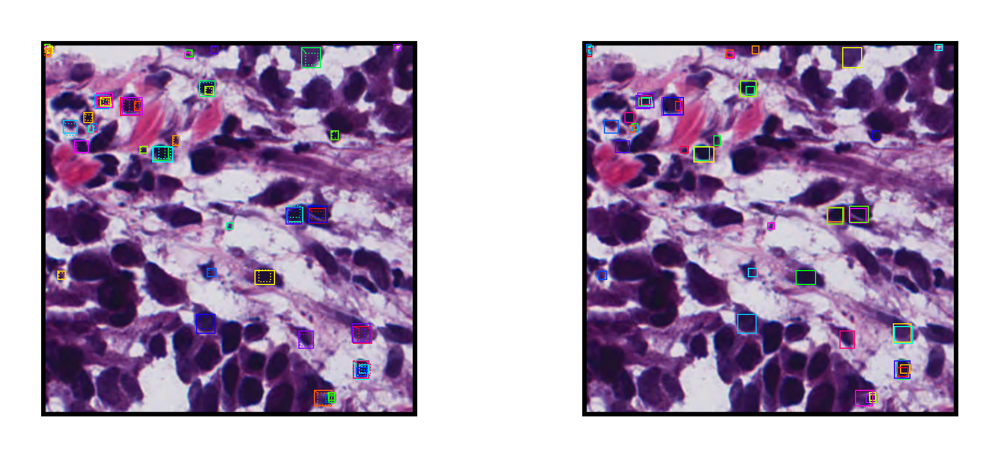

In [ ]:
# Show top anchors with refinement. Then with clipping to image boundaries
limit = 50
ax = get_ax(1, 2)
pre_nms_anchors = utils.denorm_boxes(rpn["pre_nms_anchors"][0], image.shape[:2])
refined_anchors = utils.denorm_boxes(rpn["refined_anchors"][0], image.shape[:2])
refined_anchors_clipped = utils.denorm_boxes(rpn["refined_anchors_clipped"][0], image.shape[:2])
visualize.draw_boxes(image, boxes=pre_nms_anchors[:limit],
                     refined_boxes=refined_anchors[:limit], ax=ax[0])
visualize.draw_boxes(image, refined_boxes=refined_anchors_clipped[:limit], ax=ax[1])

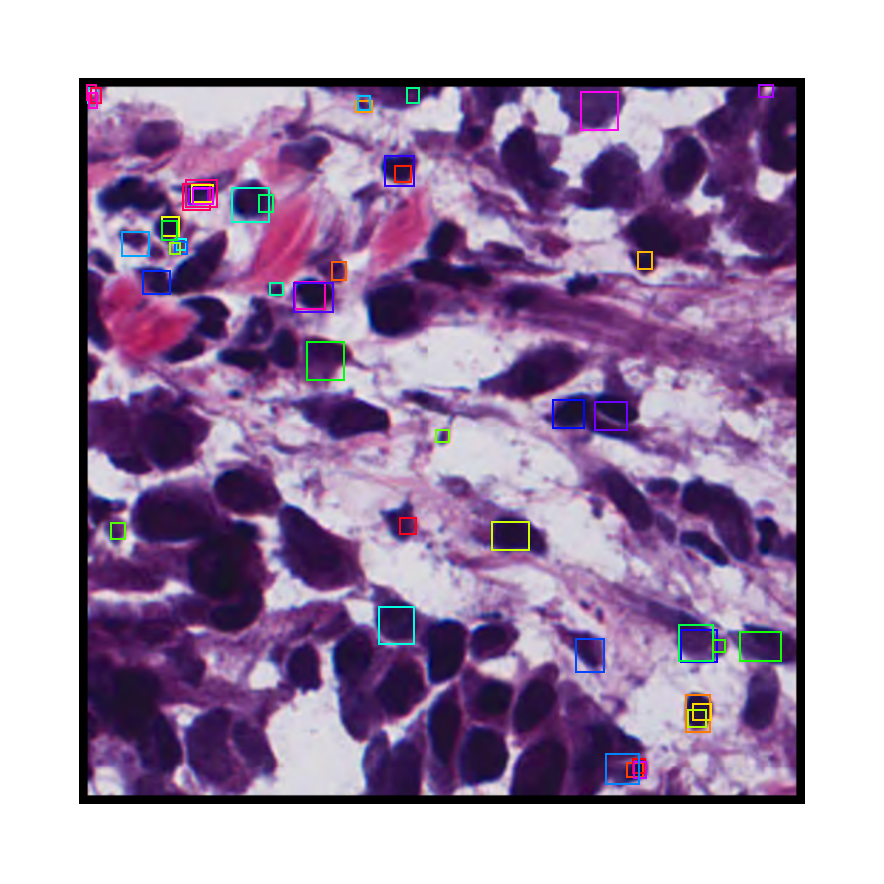

In [ ]:
# Show refined anchors after non-max suppression
limit = 50
ixs = rpn["post_nms_anchor_ix"][:limit]
visualize.draw_boxes(image, refined_boxes=refined_anchors_clipped[ixs], ax=get_ax())

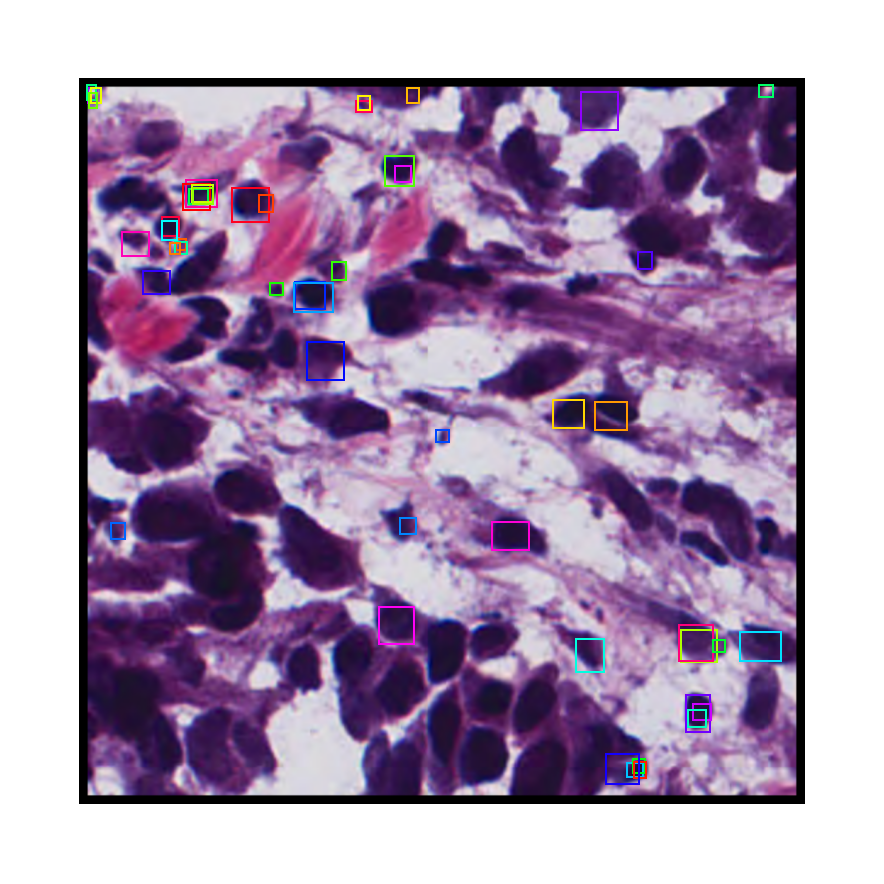

In [ ]:
# Show final proposals
# These are the same as the previous step (refined anchors 
# after NMS) but with coordinates normalized to [0, 1] range.
limit = 50
# Convert back to image coordinates for display
# h, w = config.IMAGE_SHAPE[:2]
# proposals = rpn['proposals'][0, :limit] * np.array([h, w, h, w])
visualize.draw_boxes(
    image, ax=get_ax(),
    refined_boxes=utils.denorm_boxes(rpn['proposals'][0, :limit], image.shape[:2]))

In [ ]:
# Get input and output to classifier and mask heads.
mrcnn = model.run_graph([image], [
    ("proposals", model.keras_model.get_layer("ROI").output),
    ("probs", model.keras_model.get_layer("mrcnn_class").output),
    ("deltas", model.keras_model.get_layer("mrcnn_bbox").output),
    ("masks", model.keras_model.get_layer("mrcnn_mask").output),
    ("detections", model.keras_model.get_layer("mrcnn_detection").output),
])

proposals                shape: (1, 2000, 4)          min:    0.00510  max:    0.99581  float32
probs                    shape: (1, 2000, 2)          min:    0.00031  max:    0.99969  float32
deltas                   shape: (1, 2000, 2, 4)       min:   -2.97908  max:    3.12250  float32
masks                    shape: (1, 400, 28, 28, 2)   min:    0.00000  max:    0.99997  float32
detections               shape: (1, 400, 6)           min:    0.00000  max:    1.00000  float32


98 detections: ['nucleus' 'nucleus' 'nucleus' 'nucleus' 'nucleus' 'nucleus' 'nucleus'
 'nucleus' 'nucleus' 'nucleus' 'nucleus' 'nucleus' 'nucleus' 'nucleus'
 'nucleus' 'nucleus' 'nucleus' 'nucleus' 'nucleus' 'nucleus' 'nucleus'
 'nucleus' 'nucleus' 'nucleus' 'nucleus' 'nucleus' 'nucleus' 'nucleus'
 'nucleus' 'nucleus' 'nucleus' 'nucleus' 'nucleus' 'nucleus' 'nucleus'
 'nucleus' 'nucleus' 'nucleus' 'nucleus' 'nucleus' 'nucleus' 'nucleus'
 'nucleus' 'nucleus' 'nucleus' 'nucleus' 'nucleus' 'nucleus' 'nucleus'
 'nucleus' 'nucleus' 'nucleus' 'nucleus' 'nucleus' 'nucleus' 'nucleus'
 'nucleus' 'nucleus' 'nucleus' 'nucleus' 'nucleus' 'nucleus' 'nucleus'
 'nucleus' 'nucleus' 'nucleus' 'nucleus' 'nucleus' 'nucleus' 'nucleus'
 'nucleus' 'nucleus' 'nucleus' 'nucleus' 'nucleus' 'nucleus' 'nucleus'
 'nucleus' 'nucleus' 'nucleus' 'nucleus' 'nucleus' 'nucleus' 'nucleus'
 'nucleus' 'nucleus' 'nucleus' 'nucleus' 'nucleus' 'nucleus' 'nucleus'
 'nucleus' 'nucleus' 'nucleus' 'nucleus' 'nucleus' 'nucleus' '

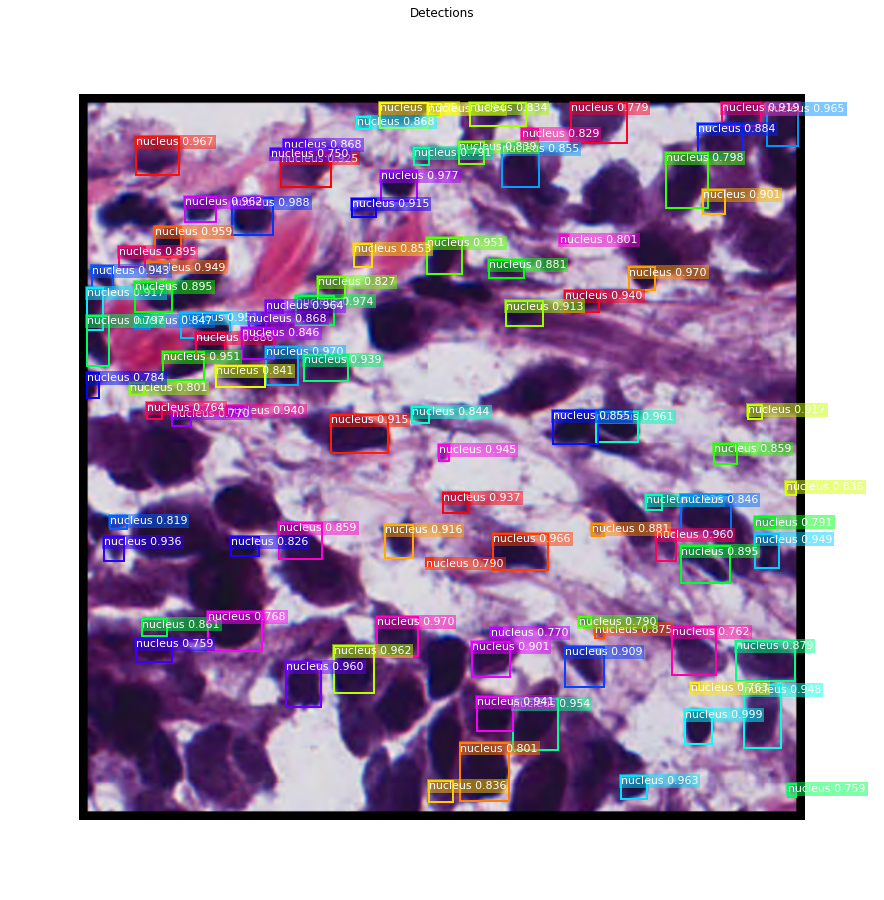

In [ ]:
# Get detection class IDs. Trim zero padding.
det_class_ids = mrcnn['detections'][0, :, 4].astype(np.int32)
det_count = np.where(det_class_ids == 0)[0][0]
det_class_ids = det_class_ids[:det_count]
detections = mrcnn['detections'][0, :det_count]

print("{} detections: {}".format(
    det_count, np.array(dataset.class_names)[det_class_ids]))

captions = ["{} {:.3f}".format(dataset.class_names[int(c)], s) if c > 0 else ""
            for c, s in zip(detections[:, 4], detections[:, 5])]
visualize.draw_boxes(
    image, 
    refined_boxes=utils.denorm_boxes(detections[:, :4], image.shape[:2]),
    visibilities=[2] * len(detections),
    captions=captions, title="Detections",
    ax=get_ax())

In [ ]:
# Proposals are in normalized coordinates
proposals = mrcnn["proposals"][0]

# Class ID, score, and mask per proposal
roi_class_ids = np.argmax(mrcnn["probs"][0], axis=1)
roi_scores = mrcnn["probs"][0, np.arange(roi_class_ids.shape[0]), roi_class_ids]
roi_class_names = np.array(dataset.class_names)[roi_class_ids]
roi_positive_ixs = np.where(roi_class_ids > 0)[0]

# How many ROIs vs empty rows?
print("{} Valid proposals out of {}".format(np.sum(np.any(proposals, axis=1)), proposals.shape[0]))
print("{} Positive ROIs".format(len(roi_positive_ixs)))

# Class counts
print(list(zip(*np.unique(roi_class_names, return_counts=True))))

2000 Valid proposals out of 2000
540 Positive ROIs
[('BG', 1460), ('nucleus', 540)]


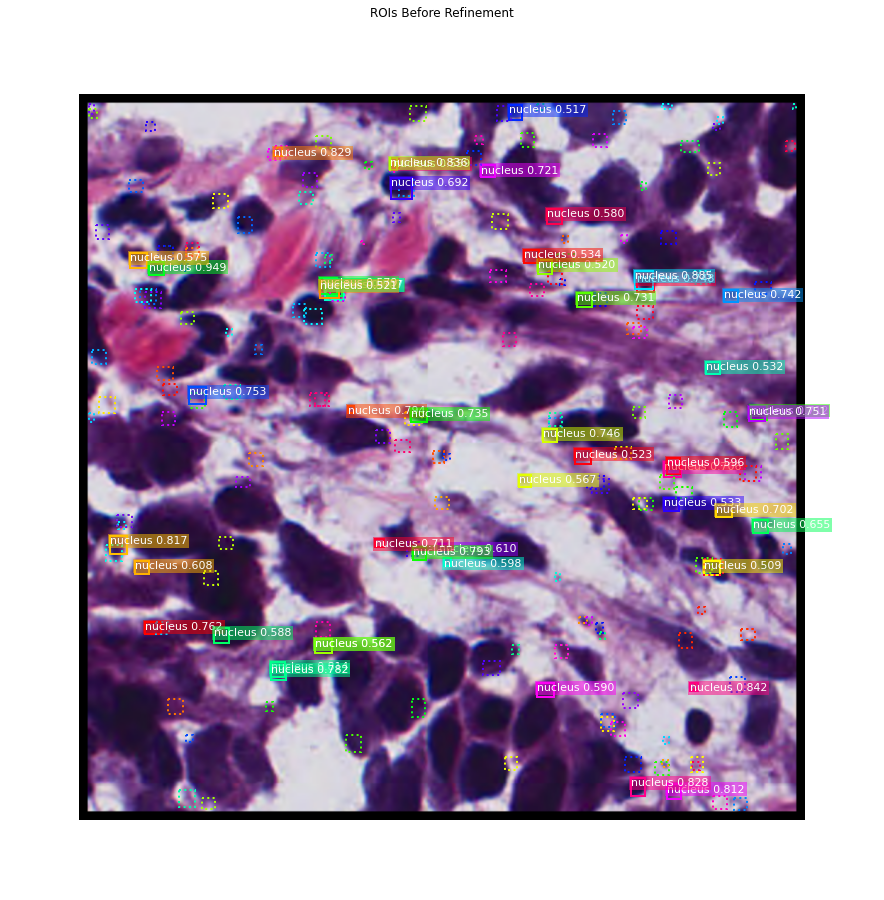

In [ ]:
# Display a random sample of proposals.
# Proposals classified as background are dotted, and
# the rest show their class and confidence score.
limit = 200
ixs = np.random.randint(0, proposals.shape[0], limit)
captions = ["{} {:.3f}".format(dataset.class_names[c], s) if c > 0 else ""
            for c, s in zip(roi_class_ids[ixs], roi_scores[ixs])]
visualize.draw_boxes(
    image,
    boxes=utils.denorm_boxes(proposals[ixs], image.shape[:2]),
    visibilities=np.where(roi_class_ids[ixs] > 0, 2, 1),
    captions=captions, title="ROIs Before Refinement",
    ax=get_ax())

roi_bbox_specific        shape: (2000, 4)             min:   -2.05780  max:    3.45689  float32
refined_proposals        shape: (2000, 4)             min:    0.00793  max:    0.98989  float32


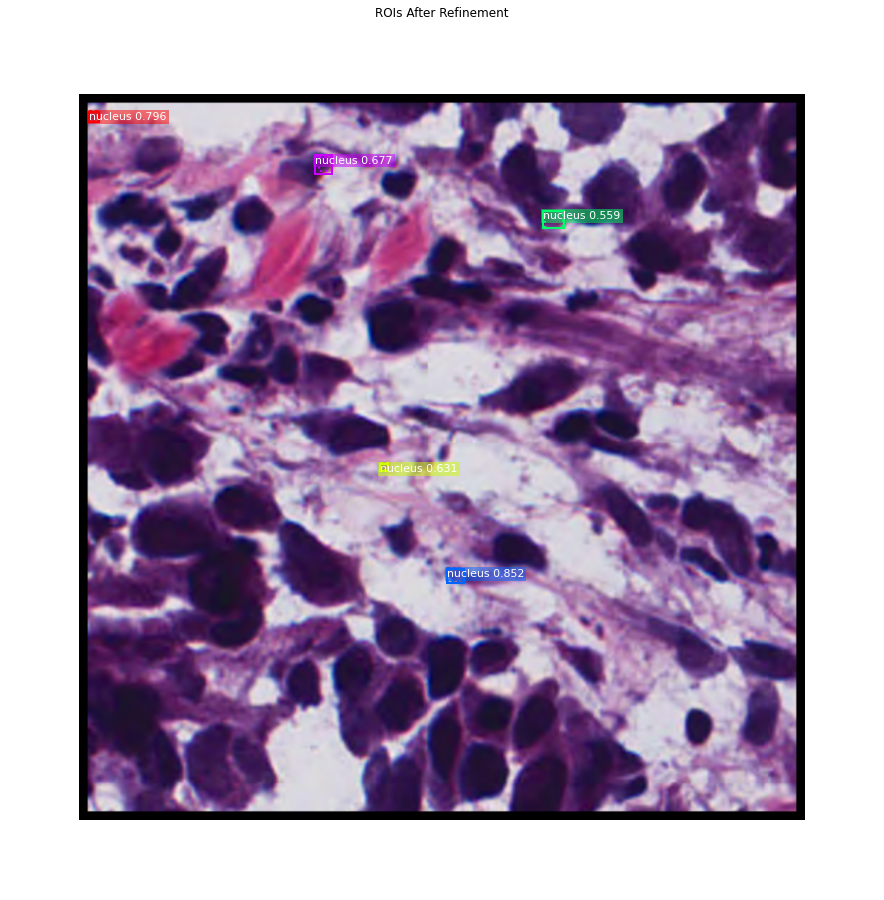

In [ ]:
# Class-specific bounding box shifts.
roi_bbox_specific = mrcnn["deltas"][0, np.arange(proposals.shape[0]), roi_class_ids]
log("roi_bbox_specific", roi_bbox_specific)

# Apply bounding box transformations
# Shape: [N, (y1, x1, y2, x2)]
refined_proposals = utils.apply_box_deltas(
    proposals, roi_bbox_specific * config.BBOX_STD_DEV)
log("refined_proposals", refined_proposals)

# Show positive proposals
# ids = np.arange(roi_boxes.shape[0])  # Display all
limit = 5
ids = np.random.randint(0, len(roi_positive_ixs), limit)  # Display random sample
captions = ["{} {:.3f}".format(dataset.class_names[c], s) if c > 0 else ""
            for c, s in zip(roi_class_ids[roi_positive_ixs][ids], roi_scores[roi_positive_ixs][ids])]
visualize.draw_boxes(
    image, ax=get_ax(),
    boxes=utils.denorm_boxes(proposals[roi_positive_ixs][ids], image.shape[:2]),
    refined_boxes=utils.denorm_boxes(refined_proposals[roi_positive_ixs][ids], image.shape[:2]),
    visibilities=np.where(roi_class_ids[roi_positive_ixs][ids] > 0, 1, 0),
    captions=captions, title="ROIs After Refinement")

In [ ]:
# Remove boxes classified as background
keep = np.where(roi_class_ids > 0)[0]
print("Keep {} detections:\n{}".format(keep.shape[0], keep))

Keep 540 detections:
[   0    1    4    5    6    7    8   10   12   13   16   17   19   20
   21   25   26   27   28   29   31   32   33   36   39   42   43   44
   45   47   48   49   50   51   52   54   56   59   60   61   62   65
   66   67   69   70   71   73   74   75   76   79   80   84   86   88
   89   90   93   94   95   97  100  102  103  106  107  108  109  110
  111  112  114  117  119  120  123  124  125  126  129  133  134  139
  142  145  146  147  150  152  154  157  161  163  165  166  167  168
  169  171  172  173  174  175  180  181  183  184  185  186  188  190
  191  192  193  200  201  202  203  206  209  211  214  217  222  223
  226  234  235  236  238  242  246  247  248  253  256  257  263  267
  269  272  273  276  277  278  279  287  289  291  294  295  302  303
  307  309  310  311  317  319  320  321  324  325  327  329  332  338
  340  341  344  347  348  353  360  361  362  363  365  366  369  382
  388  392  393  395  399  404  410  419  424  426  433 

In [ ]:
# Remove low confidence detections
keep = np.intersect1d(keep, np.where(roi_scores >= config.DETECTION_MIN_CONFIDENCE)[0])
print("Remove boxes below {} confidence. Keep {}:\n{}".format(
    config.DETECTION_MIN_CONFIDENCE, keep.shape[0], keep))

Remove boxes below 0.75 confidence. Keep 139:
[   0    1    5    7    8   10   12   13   16   17   19   20   26   27
   28   29   33   42   47   50   51   54   56   60   62   65   70   71
   73   74   76   80   86   88   93   94   97  106  108  109  112  114
  117  123  145  147  150  152  165  174  181  185  188  191  211  235
  256  269  273  276  277  291  294  295  310  311  321  324  329  344
  348  353  363  365  366  426  433  449  452  453  456  466  475  490
  507  511  512  519  540  545  549  556  571  574  581  596  602  603
  631  643  669  680  687  688  699  702  717  736  819  824  889  890
  905  911  917  930  940  959  963 1017 1072 1134 1218 1295 1454 1471
 1492 1532 1533 1562 1564 1648 1651 1727 1752 1791 1814 1820 1852]


In [ ]:
# Apply per-class non-max suppression
pre_nms_boxes = refined_proposals[keep]
pre_nms_scores = roi_scores[keep]
pre_nms_class_ids = roi_class_ids[keep]

nms_keep = []
for class_id in np.unique(pre_nms_class_ids):
    # Pick detections of this class
    ixs = np.where(pre_nms_class_ids == class_id)[0]
    # Apply NMS
    class_keep = utils.non_max_suppression(pre_nms_boxes[ixs], 
                                            pre_nms_scores[ixs],
                                            config.DETECTION_NMS_THRESHOLD)
    # Map indicies
    class_keep = keep[ixs[class_keep]]
    nms_keep = np.union1d(nms_keep, class_keep)
    print("{:22}: {} -> {}".format(dataset.class_names[class_id][:20], 
                                   keep[ixs], class_keep))

keep = np.intersect1d(keep, nms_keep).astype(np.int32)
print("\nKept after per-class NMS: {}\n{}".format(keep.shape[0], keep))

nucleus               : [   0    1    5    7    8   10   12   13   16   17   19   20   26   27
   28   29   33   42   47   50   51   54   56   60   62   65   70   71
   73   74   76   80   86   88   93   94   97  106  108  109  112  114
  117  123  145  147  150  152  165  174  181  185  188  191  211  235
  256  269  273  276  277  291  294  295  310  311  321  324  329  344
  348  353  363  365  366  426  433  449  452  453  456  466  475  490
  507  511  512  519  540  545  549  556  571  574  581  596  602  603
  631  643  669  680  687  688  699  702  717  736  819  824  889  890
  905  911  917  930  940  959  963 1017 1072 1134 1218 1295 1454 1471
 1492 1532 1533 1562 1564 1648 1651 1727 1752 1791 1814 1820 1852] -> [  10  311  321  269   29 1727  819  366  363   42 1471  152  490  545
  540    5  117   88   26    8   86 1017  123   12  174 1852  602  433
   28  365   17  596   70  631 1454   71   73   94  963   47  235  449
 1492 1651   16 1072  106  273  114   65  717 1533  66

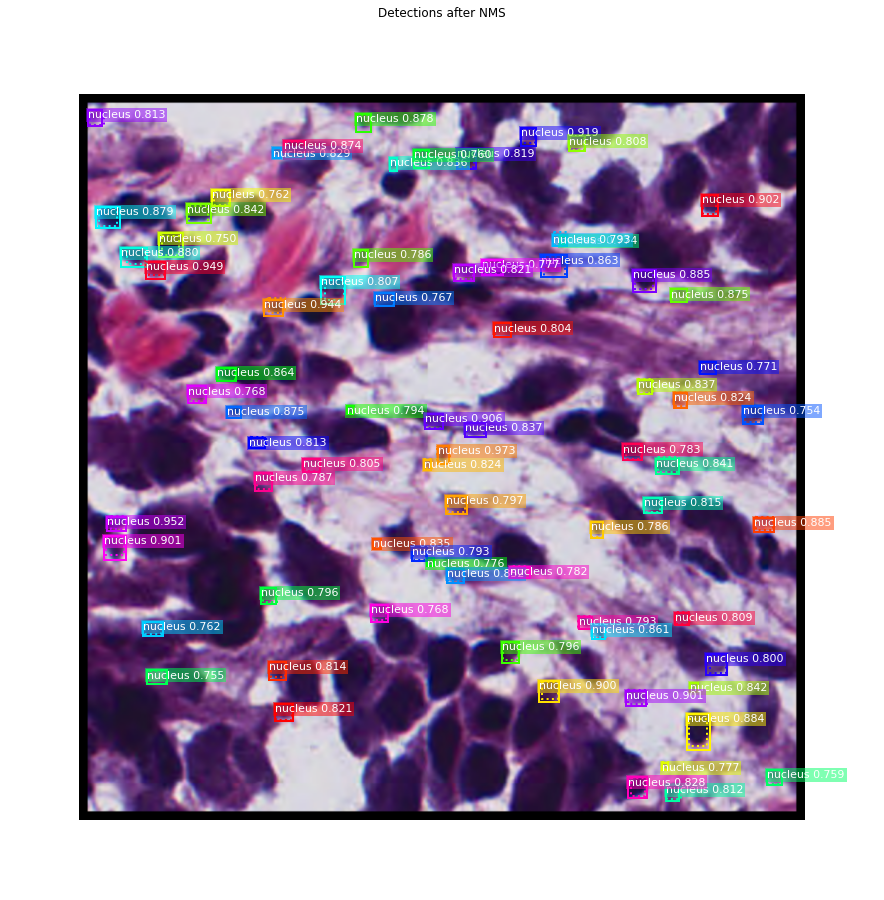

In [ ]:
# Show final detections
ixs = np.arange(len(keep))  # Display all
# ixs = np.random.randint(0, len(keep), 10)  # Display random sample
captions = ["{} {:.3f}".format(dataset.class_names[c], s) if c > 0 else ""
            for c, s in zip(roi_class_ids[keep][ixs], roi_scores[keep][ixs])]
visualize.draw_boxes(
    image,
    boxes=utils.denorm_boxes(proposals[keep][ixs], image.shape[:2]),
    refined_boxes=utils.denorm_boxes(refined_proposals[keep][ixs], image.shape[:2]),
    visibilities=np.where(roi_class_ids[keep][ixs] > 0, 1, 0),
    captions=captions, title="Detections after NMS",
    ax=get_ax())

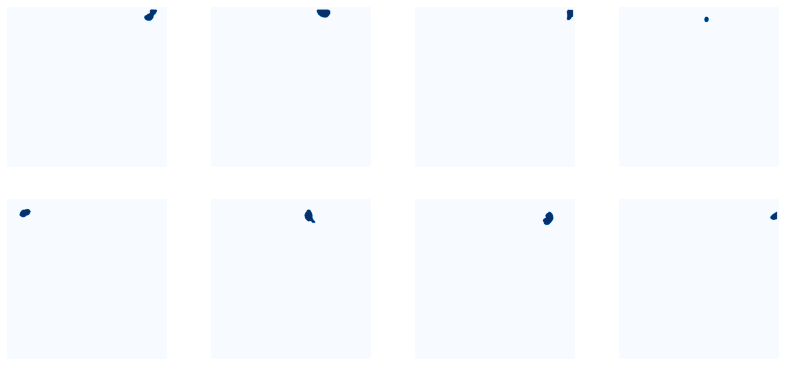

In [ ]:
limit = 8
display_images(np.transpose(gt_mask[..., :limit], [2, 0, 1]), cmap="Blues")

In [ ]:
# Get predictions of mask head
mrcnn = model.run_graph([image], [
    ("detections", model.keras_model.get_layer("mrcnn_detection").output),
    ("masks", model.keras_model.get_layer("mrcnn_mask").output),
])

# Get detection class IDs. Trim zero padding.
det_class_ids = mrcnn['detections'][0, :, 4].astype(np.int32)
det_count = np.where(det_class_ids == 0)[0][0]
det_class_ids = det_class_ids[:det_count]

print("{} detections: {}".format(
    det_count, np.array(dataset.class_names)[det_class_ids]))

detections               shape: (1, 400, 6)           min:    0.00000  max:    1.00000  float32
masks                    shape: (1, 400, 28, 28, 2)   min:    0.00075  max:    0.99854  float32
75 detections: ['nucleus' 'nucleus' 'nucleus' 'nucleus' 'nucleus' 'nucleus' 'nucleus'
 'nucleus' 'nucleus' 'nucleus' 'nucleus' 'nucleus' 'nucleus' 'nucleus'
 'nucleus' 'nucleus' 'nucleus' 'nucleus' 'nucleus' 'nucleus' 'nucleus'
 'nucleus' 'nucleus' 'nucleus' 'nucleus' 'nucleus' 'nucleus' 'nucleus'
 'nucleus' 'nucleus' 'nucleus' 'nucleus' 'nucleus' 'nucleus' 'nucleus'
 'nucleus' 'nucleus' 'nucleus' 'nucleus' 'nucleus' 'nucleus' 'nucleus'
 'nucleus' 'nucleus' 'nucleus' 'nucleus' 'nucleus' 'nucleus' 'nucleus'
 'nucleus' 'nucleus' 'nucleus' 'nucleus' 'nucleus' 'nucleus' 'nucleus'
 'nucleus' 'nucleus' 'nucleus' 'nucleus' 'nucleus' 'nucleus' 'nucleus'
 'nucleus' 'nucleus' 'nucleus' 'nucleus' 'nucleus' 'nucleus' 'nucleus'
 'nucleus' 'nucleus' 'nucleus' 'nucleus' 'nucleus']


In [ ]:
# Masks
det_boxes = utils.denorm_boxes(mrcnn["detections"][0, :, :4], image.shape[:2])
det_mask_specific = np.array([mrcnn["masks"][0, i, :, :, c] 
                              for i, c in enumerate(det_class_ids)])
det_masks = np.array([utils.unmold_mask(m, det_boxes[i], image.shape)
                      for i, m in enumerate(det_mask_specific)])
log("det_mask_specific", det_mask_specific)
log("det_masks", det_masks)

det_mask_specific        shape: (75, 28, 28)          min:    0.00075  max:    0.99854  float32
det_masks                shape: (75, 1024, 1024)      min:    0.00000  max:    1.00000  bool


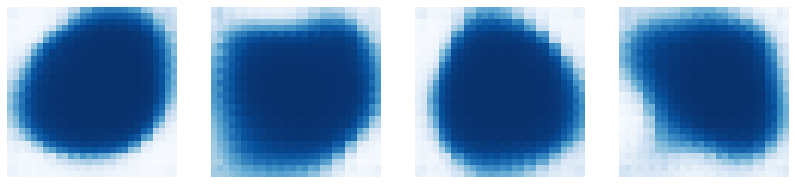

In [ ]:
display_images(det_mask_specific[:4] * 255, cmap="Blues", interpolation="none")

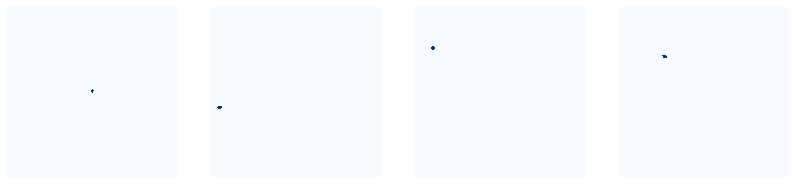

In [ ]:
display_images(det_masks[:4] * 255, cmap="Blues", interpolation="none")